In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Tfjx67wkdJJpHQJxenER")
project = rf.workspace("30201220").project("beverage-containers-3atxb-vqovx-1ubgt")
version = project.version(1)
dataset = version.download("yolov11")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 2.6 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Beverage-Containers-1 in yolov11:: 100%|██████████| 31226/31226 [00:06<00:00, 5065.01it/s]


In [2]:
%pip install ultralytics
import ultralytics
from ultralytics import YOLO
model = YOLO("yolov10n.pt")
ultralytics.checks()

Ultralytics 8.3.25 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


In [3]:
# Train YOLOv8n on COCO8 for 10 epochs
!yolo task= detect mode= train data=/kaggle/working/Beverage-Containers-1/data.yaml model= yolov10n.pt epochs=30 imgsz=640 batch=32

Ultralytics 8.3.25 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov10n.pt, data=/kaggle/working/Beverage-Containers-1/data.yaml, epochs=30, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

In [4]:
from IPython.display import Image, display

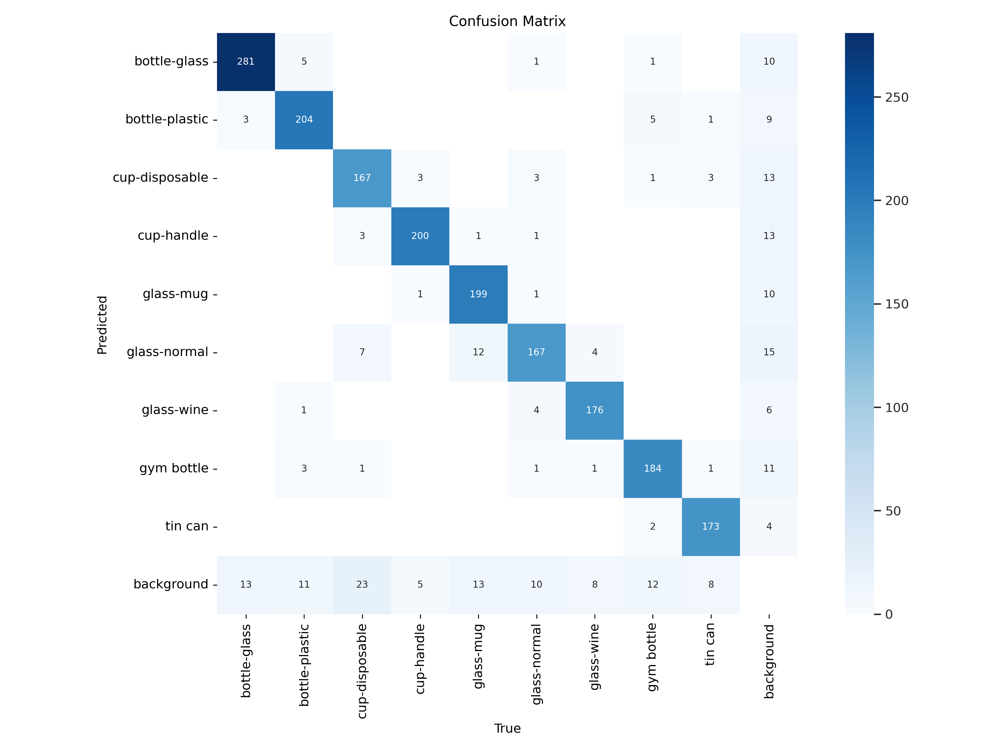

In [5]:
display(Image(filename=f"/kaggle/working/runs/detect/train/confusion_matrix.png", width=1000))

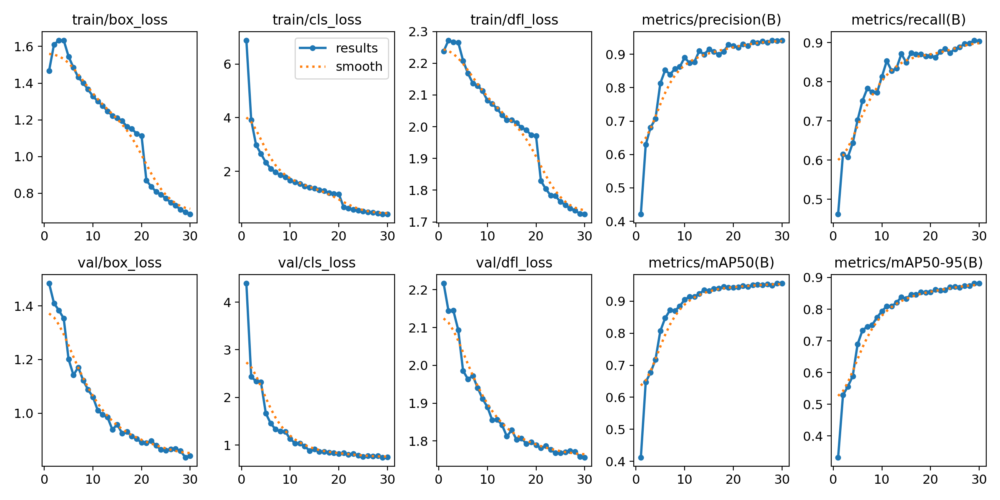

In [6]:
display(Image(filename=f"/kaggle/working/runs/detect/train/results.png", width=1000))

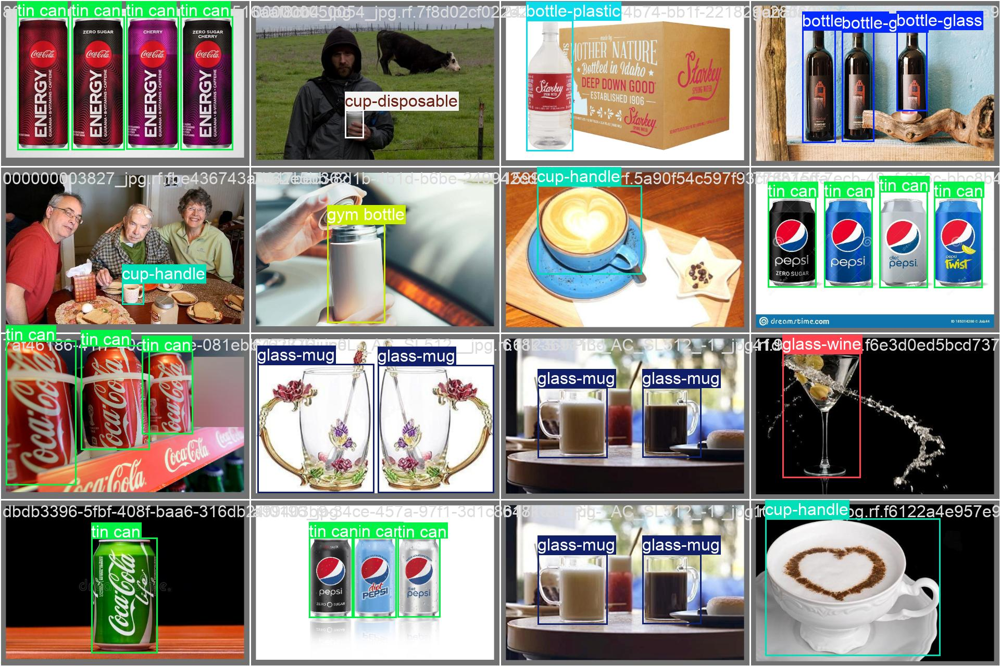

In [7]:
display(Image(filename=f"/kaggle/working/runs/detect/train/val_batch1_labels.jpg", width=1000))

In [8]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train/weights/best.pt imgsz=640 conf=0.5 \
source=/kaggle/working/Beverage-Containers-1/test/images

Ultralytics 8.3.25 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,697,926 parameters, 0 gradients, 8.2 GFLOPs

image 1/653 /kaggle/working/Beverage-Containers-1/test/images/000000002106_jpg.rf.09446312b2d89958db59bb099f8787ea.jpg: 640x448 2 glass-wines, 54.4ms
image 2/653 /kaggle/working/Beverage-Containers-1/test/images/000000008711_jpg.rf.02e611af1d5b34f1056b1a03aa53e341.jpg: 480x640 1 cup-disposable, 46.6ms
image 3/653 /kaggle/working/Beverage-Containers-1/test/images/000000017210_jpg.rf.19cafc954ec135f05045adb5e6c5f6a1.jpg: 640x640 1 cup-disposable, 12.7ms
image 4/653 /kaggle/working/Beverage-Containers-1/test/images/000000067657_jpg.rf.1d55c855eec39c3ed84b6f28143866e1.jpg: 480x640 1 bottle-glass, 1 glass-wine, 11.8ms
image 5/653 /kaggle/working/Beverage-Containers-1/test/images/000000081944_jpg.rf.a511974d11b696d95f3e6af3ea78aa9a.jpg: 640x448 1 cup-handle, 13.3ms
image 6/653 /kaggle/working/Beverage-Containers-1/test/images/0000000

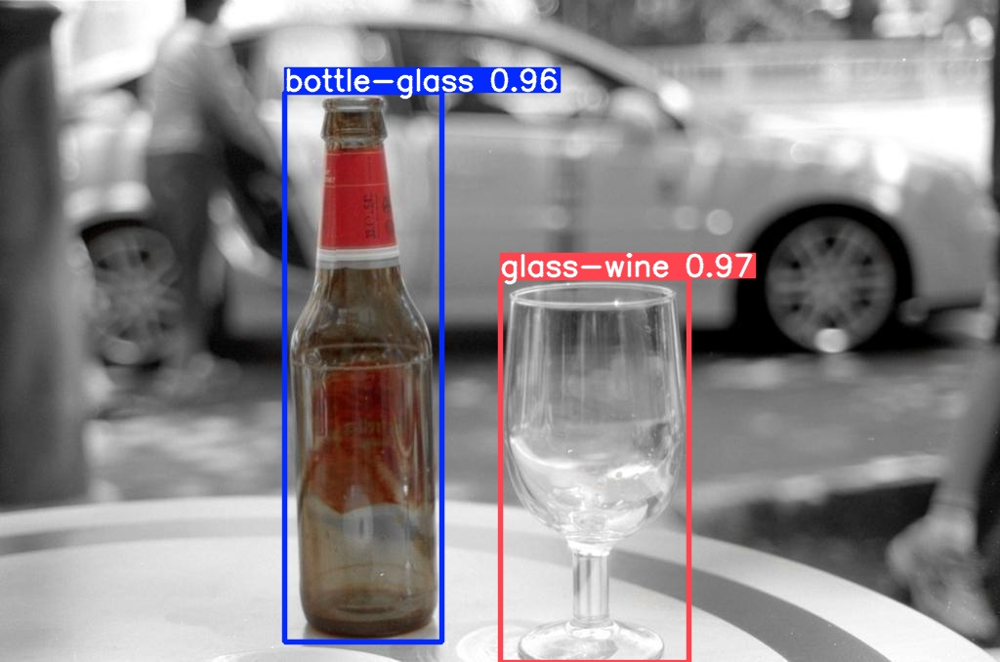

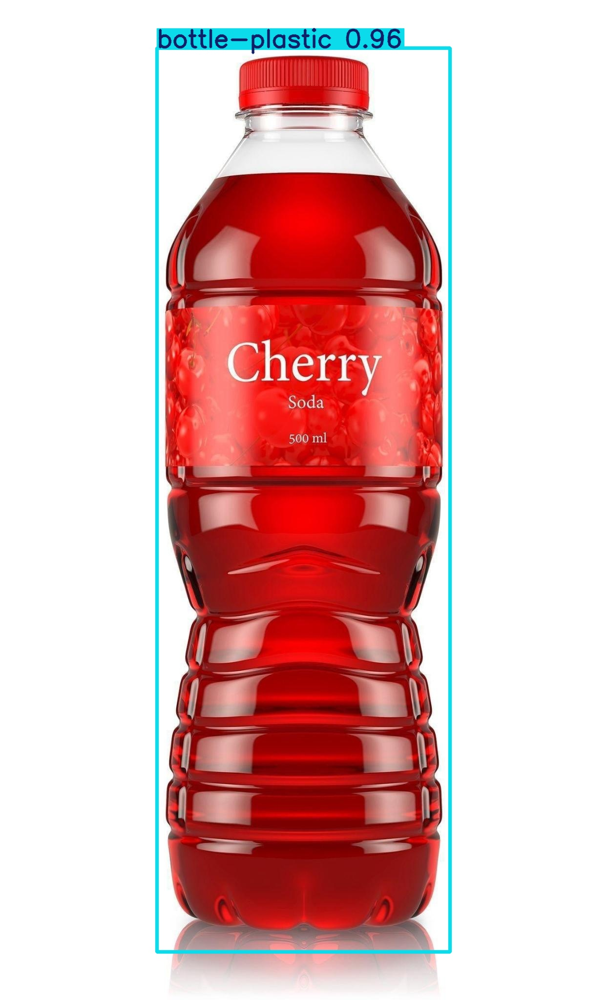

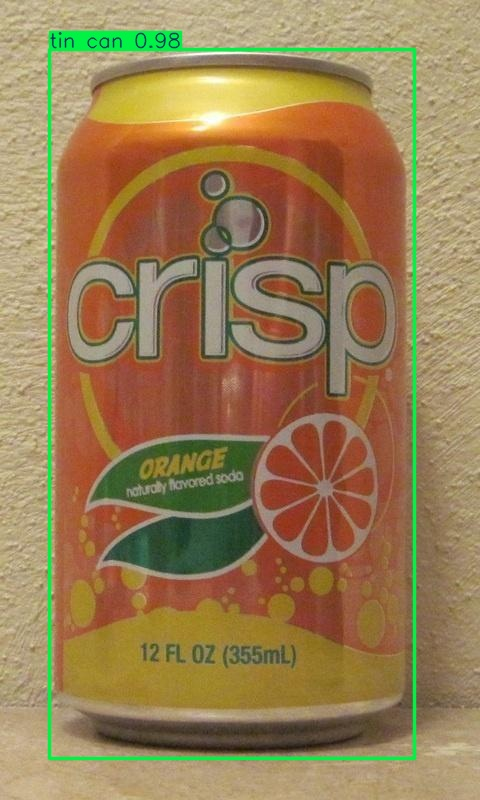

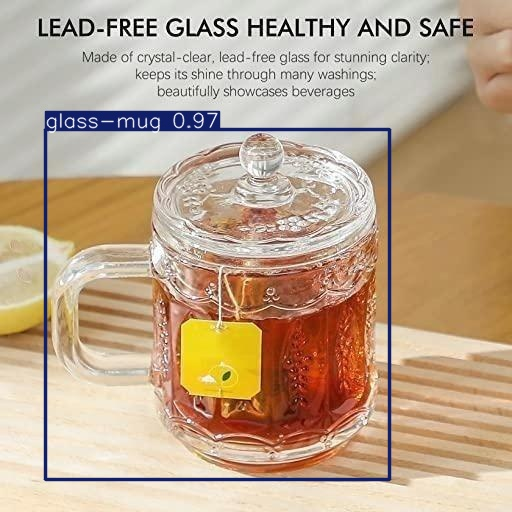

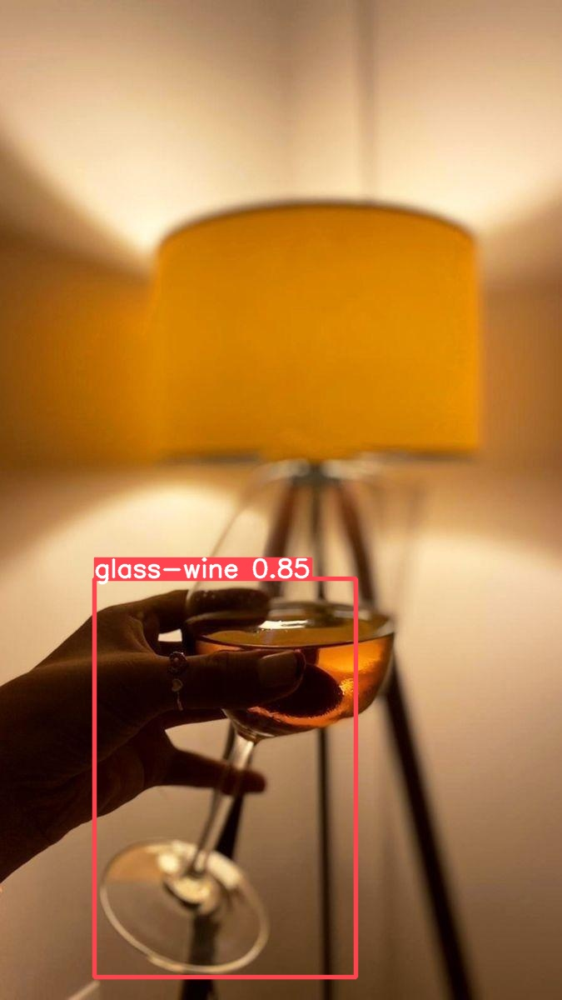

...

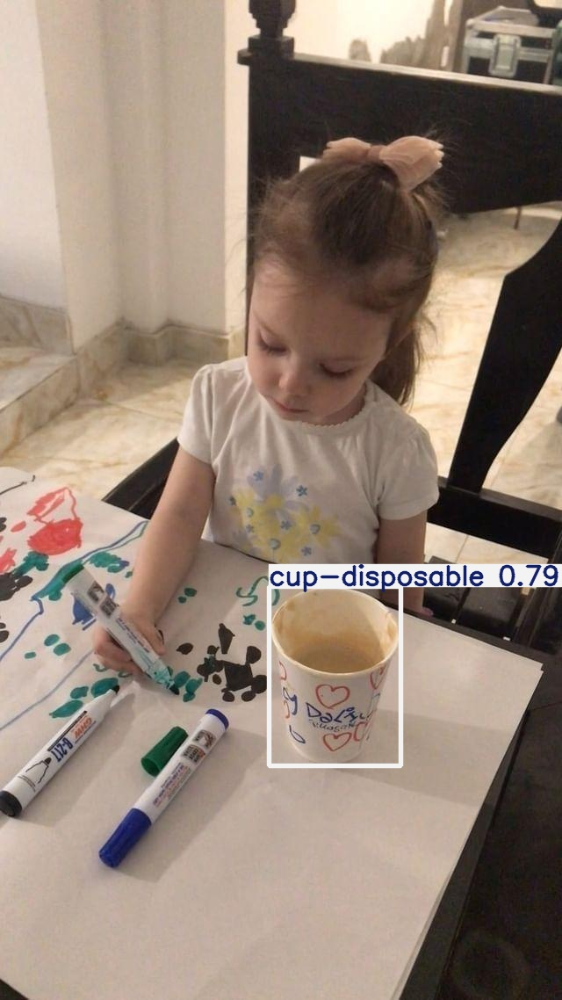

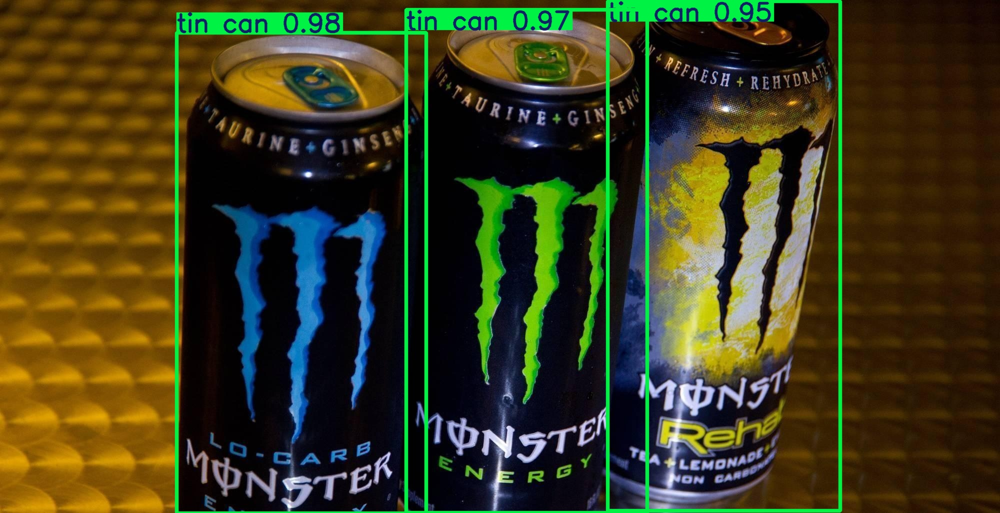

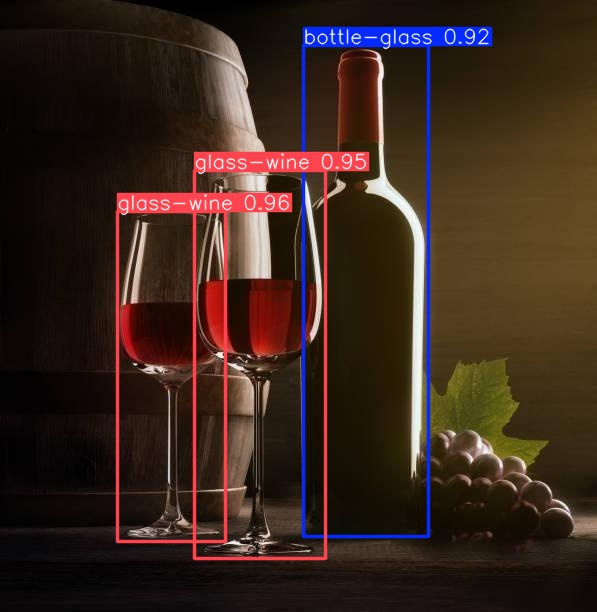

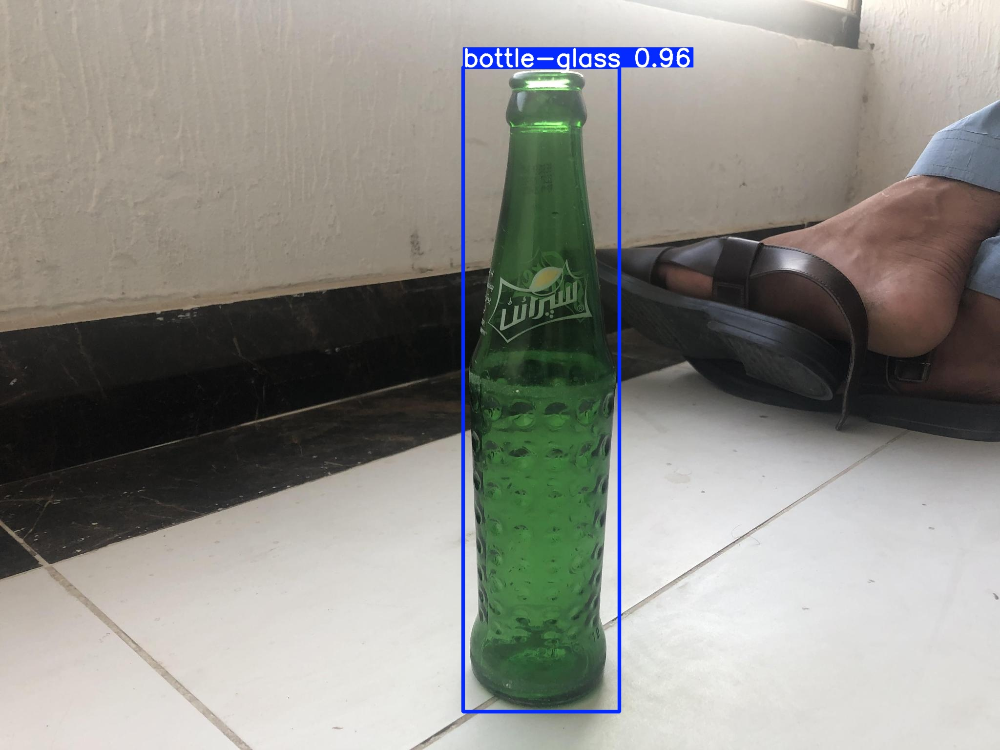

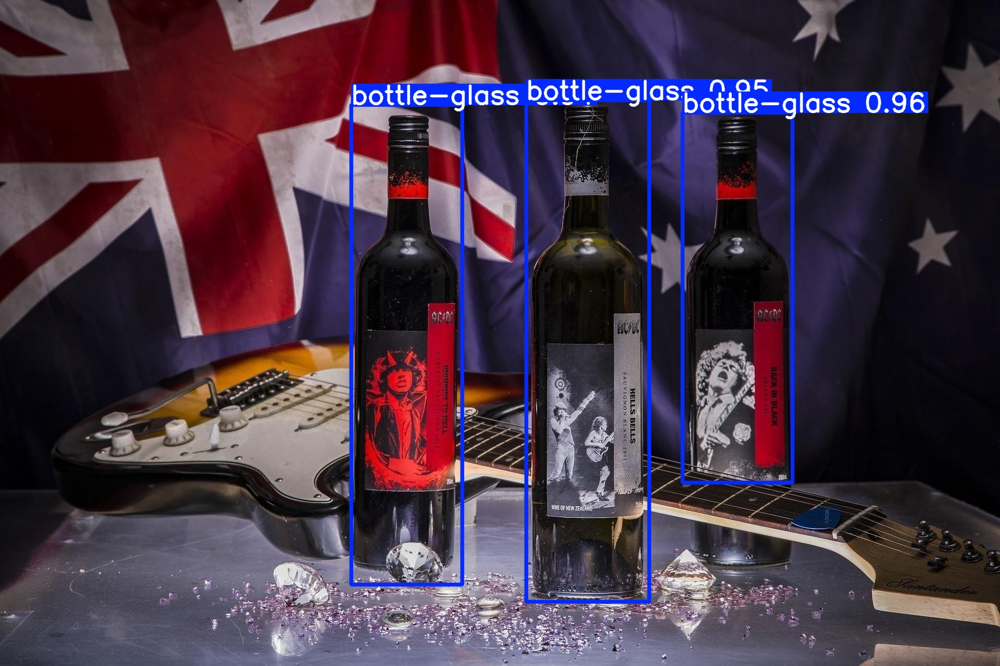

In [9]:
# Display inference on ALL test images
import glob
from IPython.display import Image, display
i = 0
for imageName in glob.glob("/kaggle/working/runs/detect/predict/*.jpg"): #assuming JPG
    if i %15 ==0 :
        print("\n")
        display(Image(filename=imageName))
    i = i +1
